# **Advanced Finding Lane Lines on the Road** 

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.


## Import packages and display sample image 

In [1]:
#importing some useful packages
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cv2
import os
from PIL import Image

%matplotlib inline

This image is: <class 'numpy.ndarray'> with dimesions: (720, 1280, 3)


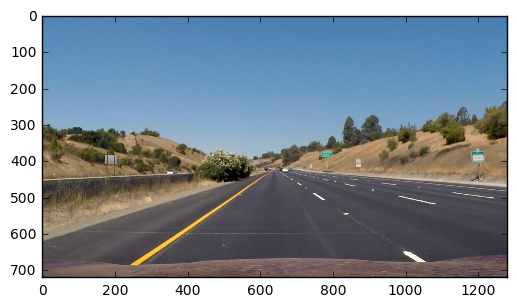

In [2]:
#reading in an image
image = mpimg.imread('./test_images/straight_lines1.jpg')

#printing out some stats and plotting
print('This image is:', type(image), 'with dimesions:', image.shape)
plt.imshow(image)  

## Functions

Define the functions which is necessary for the advanced lane finding algorithm

In [3]:
# Calculate Camera matrix and Distortion coefficient 

def cal_mtx_dist(img, nx, ny):
    # Convert RGB 2 Gray
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    # Define object points and image points 
    objpoints = [] # 3D points in the real world space
    imgpoints = [] # 2D point in the image plane
    
    # find chesscoard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
   
    # Set the values for the object points like (0, 0, 0), (1, 0, 0), (2, 0, 0) ... , (nx - 1, ny - 1, 0)
    objp = np.zeros((nx * ny, 3), np.float32)
    objp[:, :2] = np.mgrid[0:nx, 0:ny].T.reshape(-1, 2) # x,y coordinates
    
    # If corners are found, add object points and image points and return camera metrix and distortion coefficients
    if ret == True:
        imgpoints.append(corners)
        objpoints.append(objp)
        
#         img_chessboard = cv2.drawChessboardCorners(img, (nx, ny), corners, ret)
        
        ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img.shape[0:2], None, None)
        
        check = True
        
        return mtx, dist, check
    
    else:
        mtx = None
        dist = None
        check = False
        return mtx, dist, check

# Calculate transform matrix M and warp the image to a top-down view 
def cal_perspective(img, src, dst, mtx, dist, ret = True):
    
    if ret == True:
        M = cv2.getPerspectiveTransform(src, dst)
        Minv = cv2.getPerspectiveTransform(dst, src)
        warped = cv2.warpPerspective(img, M, img_size, flags = cv2.INTER_LINEAR)
        
        check = True 
    
        return M, Minv, warped, check
    else:
        M = None
        M_inv = None
        warped = None
        check = False
        
        return M, Minv, warped, check
    
# Applying sobel on x or y 
# Then takes an absolute value and applies a threshold
def abs_sobel_thresh(img, thresh_xy, orient):
    # Convert to gray scale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    # Take the derivative in x or y given orient = 'x' or 'y'
    if orient == 'x':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
    elif orient == 'y':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1)
        
    # Take the absolute value of the derivative or gradient 
    abs_sobel = np.absolute(sobel)
    
    # Scale to (0 to 255) then convert to type = np.uint8
    scaled_sobel = np.uint8(255 * abs_sobel / np.max(abs_sobel))
    
    # Create a mask of 1's where the scaled gradient magnitude
    sobel_binary = np.zeros_like(scaled_sobel)
    sobel_binary[(scaled_sobel >= thresh_xy[0]) & (scaled_sobel <= thresh_xy[1])] = 1
    
    binary_output = sobel_binary
    
    return binary_output

# Compute the magnitude of gradient and apply a threshold
def mag_thresh(img, thresh_mag, sobel_kernel):
    # Convert to gray scale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    # Take the derivative in x, y seperately
    sobel_X = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize = sobel_kernel)
    sobel_Y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize = sobel_kernel)
        
    # Calculate magnitude
    abs_sobel = np.sqrt(np.power(sobel_X, 2) + np.power(sobel_Y, 2))
    
    # Scale to (0 to 255) then convert to type = np.uint8
    scaled_sobel = np.uint8(255 * abs_sobel / np.max(abs_sobel))
    
    # Create a mask of 1's where the scaled gradient magnitude
    sobel_binary = np.zeros_like(scaled_sobel)
    sobel_binary[(scaled_sobel >= thresh_mag[0]) & (scaled_sobel <= thresh_mag[1])] = 1
    
    binary_output = sobel_binary
    
    return binary_output

# Compute the direction of the gradient and applies a threshold
def dir_thresh(img, thresh_dir, sobel_kernel):
    # Convert to gray scale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    # Take the derivative in x, y seperately
    sobel_X = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize = sobel_kernel)
    sobel_Y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize = sobel_kernel)
        
    # Take the absolute value of the x and y gradient seperately
    abs_sobel_X = np.sqrt(np.power(sobel_X, 2))
    abs_sobel_Y = np.sqrt(np.power(sobel_Y, 2))
    
    # Use np.arctan2(abs_sobel_Y, abs_sobel_X) to calculate the direction of the gradient 
    dir_sobel = np.arctan2(abs_sobel_Y, abs_sobel_X)
    
    # Create a mask of 1's where the direction thresholds are met
    sobel_binary = np.zeros_like(dir_sobel)
    sobel_binary[(dir_sobel >= thresh_dir[0]) & (dir_sobel <= thresh_dir[1])] = 1
    
    binary_output = sobel_binary
    
    return binary_output    

# Compute the R, G, B, value according to "RGB_channel" and applies a threshold
def RGB_thresh(img, thresh_RGB, RGB_channel):
    # choose the color channel 
    if RGB_channel == 'R':
        img_RGB = img[:,:,0]
    elif RGB_channel == 'G':
        img_RGB = img[:,:,1]
    elif RGB_channel == 'B':
        img_RGB = img[:,:,2]
    
    # Make the img_RGB to binary according to the threshold
    binary = np.zeros_like(img_RGB)
    binary[(img_RGB >= thresh_RGB[0]) & (img_RGB <= thresh_RGB[1])] = 1
    
    # Return a binary image of threshold result
    binary_output = binary
    
    return binary_output
    

# Compute the H, L, S, value according to "HLS_channel" and applies a threshold
def HLS_thresh(img, thresh_HLS, HLS_channel):
    # Convert the image to HLS channel
    img = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    
    # choose the color channel 
    if HLS_channel == 'H':
        img_HLS = img[:,:,0]
    elif HLS_channel == 'L':
        img_HLS = img[:,:,1]
    elif HLS_channel == 'S':
        img_HLS = img[:,:,2]
    
    # Make the img_HLS to binary according to the threshold
    binary = np.zeros_like(img_HLS)
    binary[(img_HLS >= thresh_HLS[0]) & (img_HLS <= thresh_HLS[1])] = 1    

    # Return a binary image of threshold result
    binary_output = binary
    
    return binary_output

# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]  
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #x values for detected line pixels
        self.allx = None  
        #y values for detected line pixels
        self.ally = None

## Test on Images

Test advanced lane finding algorithm to the test images <p>
The process will be as follows
* Find camera calibration matrix and distortion coefficient via camera calibration with chess board image
* Make test images to binary image with gradient and color channel 
* Undistort the test images
* Apply perspective transform to the binary image 
* Find left and right lanes and fitting them to 2nd polynomial curve
* Measuring curvature of the road 


### Camera Calibration

Camera calibration with chessboard image to find `Camera matrix` and `Distortion coefficient`

In [4]:
# Print name of the images for calibration
calibration_file_list = os.listdir("./camera_cal/")
print('Chessboard Images: ' + str(calibration_file_list))

Chessboard Images: ['calibration1.jpg', 'calibration10.jpg', 'calibration11.jpg', 'calibration12.jpg', 'calibration13.jpg', 'calibration14.jpg', 'calibration15.jpg', 'calibration16.jpg', 'calibration17.jpg', 'calibration18.jpg', 'calibration19.jpg', 'calibration2.jpg', 'calibration20.jpg', 'calibration3.jpg', 'calibration4.jpg', 'calibration5.jpg', 'calibration6.jpg', 'calibration7.jpg', 'calibration8.jpg', 'calibration9.jpg']


Camera matrix and distortion coefficients are found!!


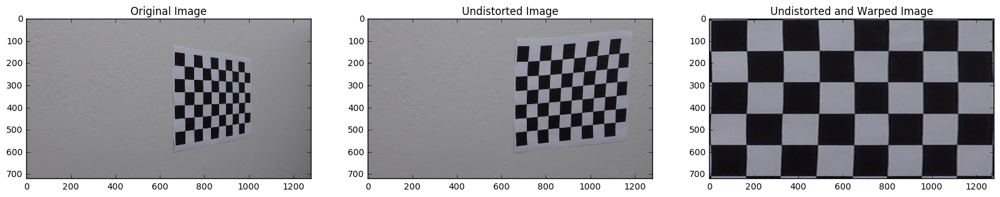

In [5]:
# Load image
file_num = 18

img_cal = mpimg.imread('./camera_cal/' + calibration_file_list[file_num])
img_cal_gray = cv2.cvtColor(img_cal, cv2.COLOR_RGB2GRAY)

nx = 9 # The number of inside corners in x
ny = 6 # The number of inside corners in y

# find chesscoard corners
ret, corners = cv2.findChessboardCorners(img_cal_gray, (nx, ny), None)

# Calculate camera matrix, distortion coefficients and check value whih they have value or not 
mtx, dist, check = cal_mtx_dist(img_cal, nx, ny)

if check == True:
    print('Camera matrix and distortion coefficients are found!!')
    
    undist = cv2.undistort(img_cal, mtx, dist)
    undist_gray = cv2.cvtColor(undist, cv2.COLOR_RGB2GRAY)
    ret_undist, corners_undist = cv2.findChessboardCorners(undist_gray, (nx, ny), None)
    
    margin = 10
    
    img_size = (img_cal.shape[1], img_cal.shape[0])
    
    # Define the 4 source points 
    src = np.float32([corners[0,0],
                      corners[nx-1, 0],
                      corners[nx*ny - 1, 0],
                      corners[nx*ny - nx, 0]])

    # Define the 4 destination points 
    dst = np.float32([[margin, margin], 
                      [img_size[0] - margin, margin], 
                      [img_size[0] - margin, img_size[1] - margin], 
                      [margin, img_size[1] - margin]])
        
    M, Minv, warped, check = cal_perspective(img_cal, src, dst, mtx, dist)
    
    # Visualization
    fig = plt.figure(figsize=(20,10))

    ax1 = fig.add_subplot(131)
    ax1.imshow(img_cal)
    ax1.set_title('Original Image')

    ax2 = fig.add_subplot(132)
    ax2.imshow(undist)
    ax2.set_title('Undistorted Image')
    
    ax3 = fig.add_subplot(133)
    ax3.imshow(warped)
    ax3.set_title('Undistorted and Warped Image')


else:
    print('Camera matrix and distortion coefficients are "NOT" found!')




### Find lane lines on test images

* Make test images to binary image with gradient and color channel 
* Undistort the test images
* Apply perspective transform to the binary image 
* Find left and right lanes and fitting them to 2nd polynomial curve
* Measuring curvature of the road 

In [6]:
# Print name of test images 
img_file_list = os.listdir("test_images/")
print('Test images: ' + str(img_file_list))

Test images: ['straight_lines1.jpg', 'straight_lines2.jpg', 'test1.jpg', 'test2.jpg', 'test3.jpg', 'test4.jpg', 'test5.jpg', 'test6.jpg']


#### Find threshhold of the gradient and color channel

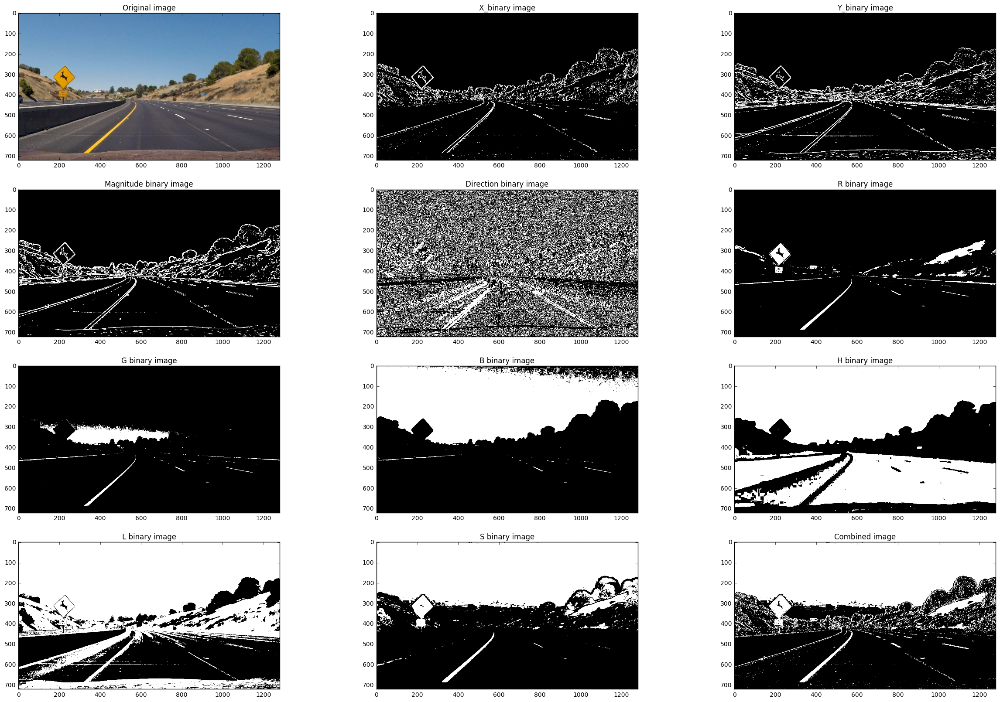

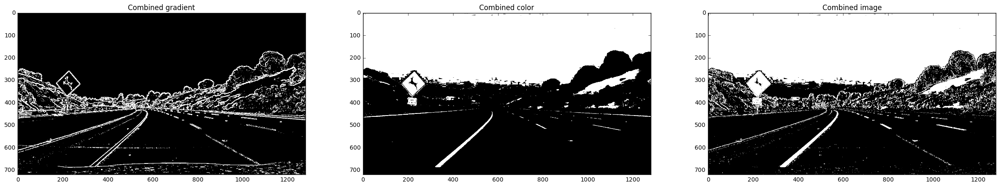

In [16]:
# Load the test image 
img_test_file = img_file_list[3]
img_test = mpimg.imread('./test_images/' + img_test_file)

# # threshold of gradient and colors
# thresh_xy  = (50, 150)
# thresh_mag = (50, 150)
# thresh_dir = (0.7, 1.3)
# thresh_RGB = (210, 255)
# thresh_HLS = (110, 255)

thresh_xy  = (20, 150)
thresh_mag = (30, 150)
thresh_dir = (0.7, 1.3)
thresh_RGB = (180, 255)
thresh_HLS = (90, 255)

x_binary = abs_sobel_thresh(img_test, thresh_xy, orient = 'x')
y_binary = abs_sobel_thresh(img_test, thresh_xy, orient = 'y')
mag_binary = mag_thresh(img_test, thresh_mag, sobel_kernel = 5)
dir_binary = dir_thresh(img_test, thresh_dir, sobel_kernel = 15 )

R_binary = RGB_thresh(img_test, thresh_RGB, RGB_channel = 'R')
G_binary = RGB_thresh(img_test, thresh_RGB, RGB_channel = 'G')
B_binary = RGB_thresh(img_test, thresh_RGB, RGB_channel = 'B')
H_binary = HLS_thresh(img_test, thresh_HLS, HLS_channel = 'H')
L_binary = HLS_thresh(img_test, thresh_HLS, HLS_channel = 'L')
S_binary = HLS_thresh(img_test, thresh_HLS, HLS_channel = 'S')

# Combine the color channel which finds the lane line properly
combined_gradient = np.zeros_like(S_binary)
combined_gradient[((mag_binary == 1) | (dir_binary == 1)) & ((x_binary == 1) | (y_binary==1))] = 1
combined_color = np.zeros_like(S_binary)
combined_color[((R_binary == 1) & (G_binary == 1)) | ((S_binary == 1) & (L_binary == 1))] = 1
combined_binary = np.zeros_like(S_binary)
combined_binary[((mag_binary == 1) | (dir_binary == 1)) & ((x_binary == 1) | (y_binary==1)) & ((R_binary == 1) & (G_binary == 1)) | ((S_binary == 1) & (L_binary == 1)) | (x_binary == 1)] = 1


f = plt.figure(0)
f, ((ax1, ax2, ax3), (ax4, ax5, ax6), (ax7, ax8, ax9), (ax10, ax11, ax12)) = plt.subplots(4, 3, figsize=(30,20))
ax1.set_title('Original image')
ax1.imshow(img_test)
ax2.set_title('X_binary image')
ax2.imshow(x_binary, cmap = 'gray')
ax3.set_title('Y_binary image')
ax3.imshow(y_binary, cmap = 'gray')
ax4.set_title('Magnitude binary image')
ax4.imshow(mag_binary, cmap = 'gray')
ax5.set_title('Direction binary image')
ax5.imshow(dir_binary, cmap = 'gray')
ax6.set_title('R binary image')
ax6.imshow(R_binary, cmap = 'gray')
ax7.set_title('G binary image')
ax7.imshow(G_binary, cmap = 'gray')
ax8.set_title('B binary image')
ax8.imshow(B_binary, cmap = 'gray')
ax9.set_title('H binary image')
ax9.imshow(H_binary, cmap = 'gray')
ax10.set_title('L binary image')
ax10.imshow(L_binary, cmap = 'gray')
ax11.set_title('S binary image')
ax11.imshow(S_binary, cmap = 'gray')
ax12.set_title('Combined image')
ax12.imshow(combined_binary, cmap = 'gray')

f2 = plt.figure(2)
f2, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(30,20))
ax1.imshow(combined_gradient, cmap = 'gray')
ax1.set_title('Combined gradient')
ax2.imshow(combined_color, cmap = 'gray')
ax2.set_title('Combined color')
ax3.imshow(combined_binary, cmap='gray')
ax3.set_title('Combined image')

#### Apply perspective transform to the binary image

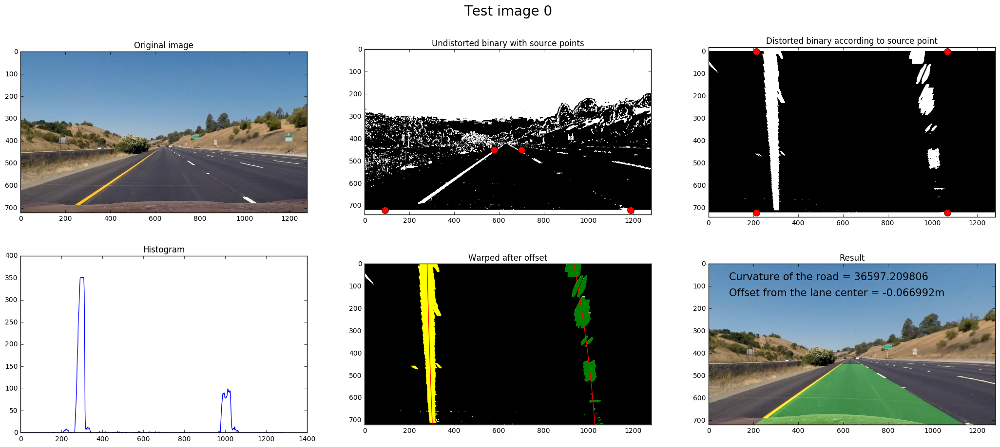

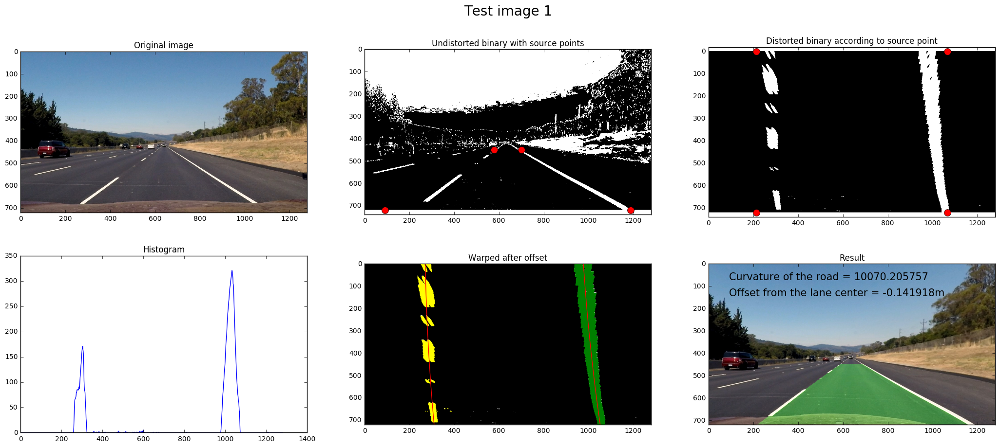

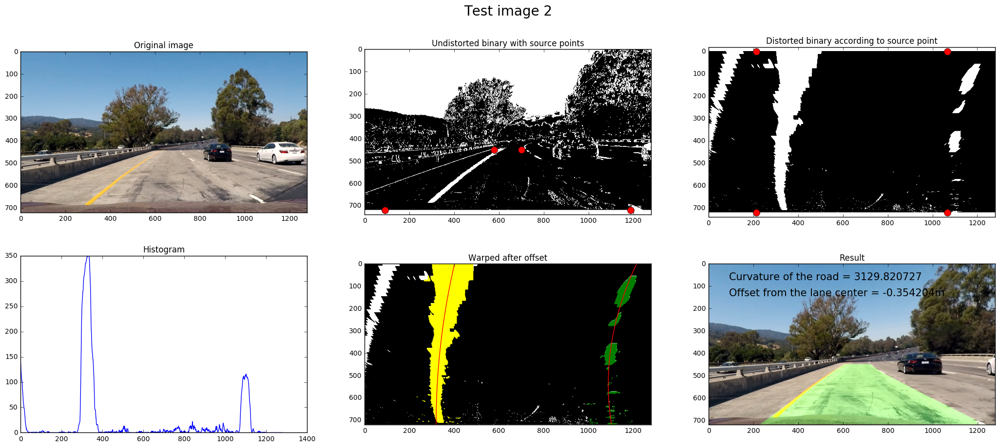

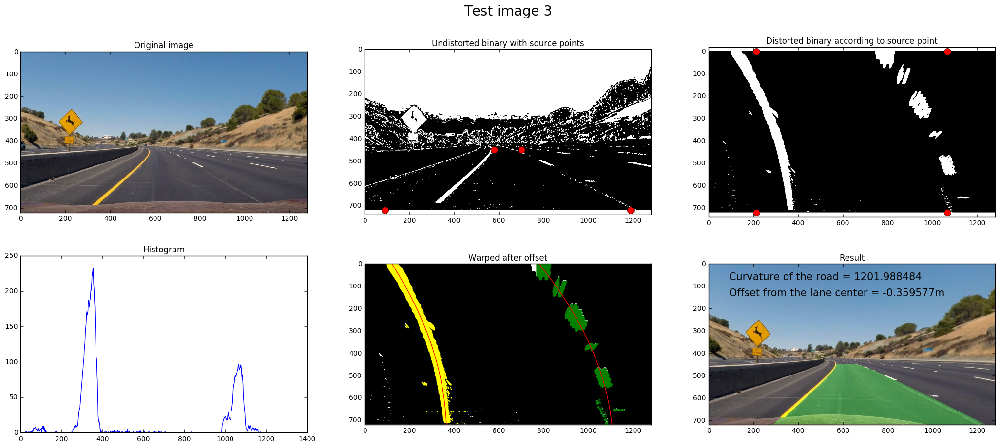

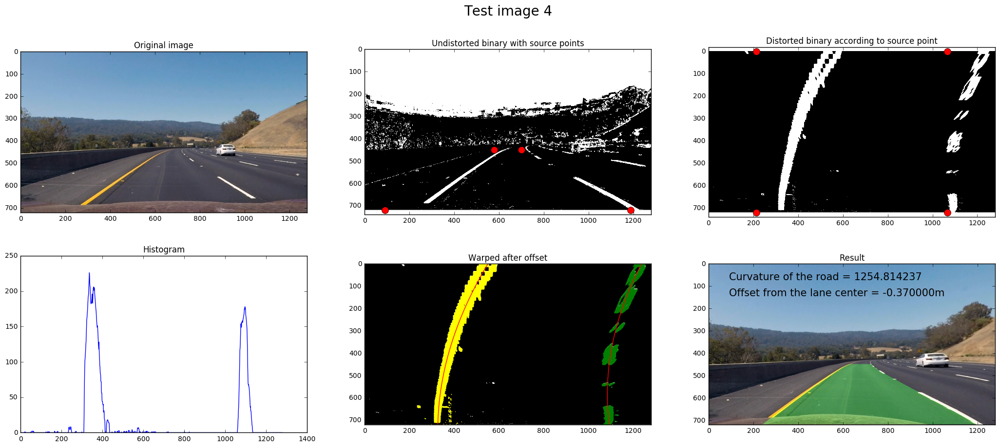

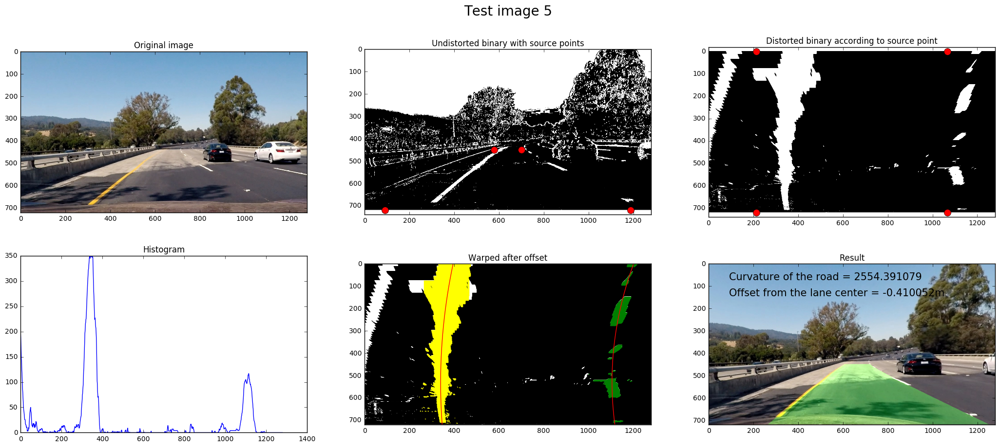

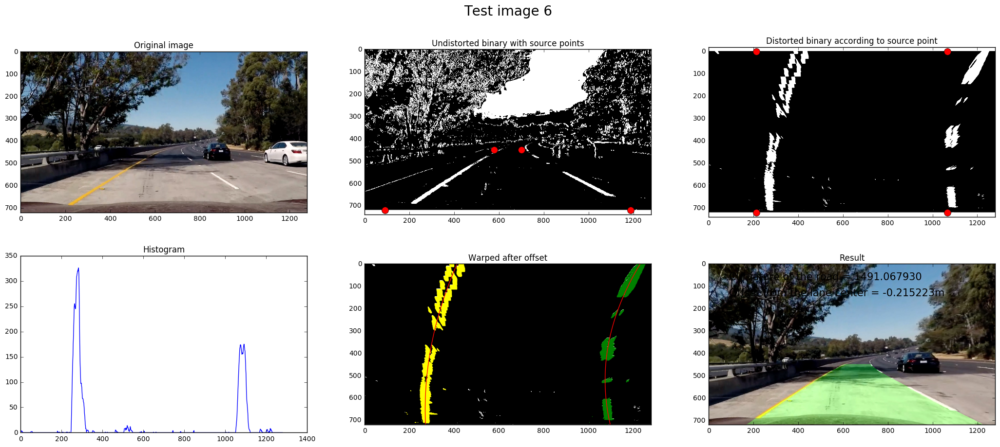

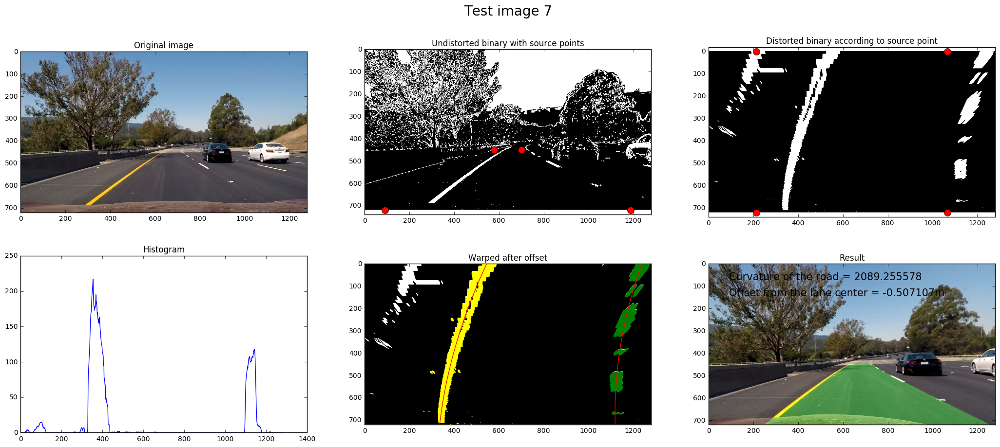

In [17]:
# Draw lane lines on the test images 

for i, img_file in enumerate(img_file_list):
    # Load test image
    img = mpimg.imread('./test_images/' + img_file)
    img_size = (img.shape[1], img.shape[0])

    # ------------------------------ Make test images to binary image with gradient and color channel ------------------------------
    x_binary = abs_sobel_thresh(img, thresh_xy, orient = 'x')
    y_binary = abs_sobel_thresh(img, thresh_xy, orient = 'y')
    mag_binary = mag_thresh(img, thresh_mag, sobel_kernel = 5)
    dir_binary = dir_thresh(img, thresh_dir, sobel_kernel = 15 )

    R_binary = RGB_thresh(img, thresh_RGB, RGB_channel = 'R')
    G_binary = RGB_thresh(img, thresh_RGB, RGB_channel = 'G')
    B_binary = RGB_thresh(img, thresh_RGB, RGB_channel = 'B')
    H_binary = HLS_thresh(img, thresh_HLS, HLS_channel = 'H')
    L_binary = HLS_thresh(img, thresh_HLS, HLS_channel = 'L')
    S_binary = HLS_thresh(img, thresh_HLS, HLS_channel = 'S')

    combined_binary = np.zeros_like(S_binary)
    combined_binary[((mag_binary == 1) | (dir_binary == 1)) & ((x_binary == 1) | (y_binary==1)) & ((R_binary == 1) & (G_binary == 1)) | ((S_binary == 1) & (L_binary == 1)) | (x_binary == 1)] = 1

    # ------------------------------ Perspective transform of the  binary images ------------------------------
    img_undist = cv2.undistort(img, mtx, dist)
    binary_undist = cv2.undistort(combined_binary, mtx, dist)
    
    # set the corner points 
    corners = [(img_size[0]/14,img_size[1]),\
               (img_size[0] - img_size[0]/14, img_size[1]),\
               (img_size[0]/2 - img_size[0]/21, img_size[1]/2 + img_size[1]/8),\
               (img_size[0]/2 + img_size[0]/21, img_size[1]/2 + img_size[1]/8)]
    
    nx = 2
    ny = 2
    
    # Define the 4 source points 
    src = np.float32([corners[0],
                      corners[nx-1],
                      corners[nx*ny - 1],
                      corners[nx*ny - nx]])

    # Define the 4 destination points 
    dst = np.float32([[img_size[0]/6, img_size[1]], 
                      [img_size[0] - img_size[0]/6, img_size[1]], 
                      [img_size[0] - img_size[0]/6, 0], 
                      [img_size[0]/6, 0]])

    M, Minv, warped, check = cal_perspective(binary_undist, src, dst, mtx, dist)

    histogram = np.sum(warped[int(1 * warped.shape[0]/2):,:], axis = 0)
    
    left_peak_base = np.argmax(histogram[:int(img_size[0]/2)])
    right_peak_base = np.argmax(histogram[int(img_size[0]/2):]) + int(img_size[0]/2)

    # ------------------------------ Find offset between lane center and camera ------------------------------    
    lane_center_index_warped = int((left_peak_base + right_peak_base) / 2)
    diff_lane_center_warped = lane_center_index_warped - int(img_size[0]/2)
    diff_lane_width = right_peak_base - left_peak_base
    offset_from_lane_center_m = - diff_lane_center_warped * 3.7 / diff_lane_width
   
    # ------------------------------ Find lane lines of the wapred image ------------------------------
    left_peak_current = left_peak_base
    right_peak_current = right_peak_base
    
    window_num = 10
    window_height = np.int(warped.shape[0]/window_num)

    margin = 100
    
    min_pixel = 20
    
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])

    left_lane_index  = []
    right_lane_index = []
    
    left_lane_check = []
    right_lane_check = []
    
    n_check = 3
    
    # Step through the windows one by one
    for window in range(window_num):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = warped.shape[0] - (window+1)*window_height
        win_y_high = warped.shape[0] - window*window_height
        
        win_xleft_low = left_peak_current - margin
        win_xleft_high = left_peak_current + margin
        
        win_xright_low = right_peak_current - margin
        win_xright_high = right_peak_current + margin

        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_index.append(good_left_inds)
        right_lane_index.append(good_right_inds)
        
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > min_pixel:
            left_peak_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > min_pixel:        
            right_peak_current = np.int(np.mean(nonzerox[good_right_inds]))
        
        # Calculate difference of current lane peak and former lane peak 
        if window > 0:
            diff_left_X = left_peak_current - left_peak_old
            diff_right_X = right_peak_current - right_peak_old
            left_lane_check.append(diff_left_X)
            right_lane_check.append(diff_right_X)

        # If check data are cumulated and there is no data, current peak is not fix and moved via mean of the check list 
        if len(left_lane_check) == n_check:
            left_mean = sum(left_lane_check) / len(left_lane_check)
            right_mean = sum(right_lane_check) / len(right_lane_check)
             
            if diff_left_X == 0:
                del left_lane_check[n_check - 1]
                left_lane_check.append(left_mean)
                left_peak_current += left_mean
            
            if diff_right_X == 0:
                del right_lane_check[n_check - 1]
                right_lane_check.append(left_mean)
                right_peak_current += right_mean

            del left_lane_check[0]
            del right_lane_check[0]
        
        left_peak_old = left_peak_current
        right_peak_old = right_peak_current     

    # Concatenate the arrays of indices
    left_lane_index = np.concatenate(left_lane_index)
    right_lane_index = np.concatenate(right_lane_index)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_index]
    lefty = nonzeroy[left_lane_index] 
    rightx = nonzerox[right_lane_index]
    righty = nonzeroy[right_lane_index] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, warped.shape[0]-1, warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    # ------------------------------ Calculate road curvature ------------------------------ 
    R_curvature = np.power(1 + np.power(2 * left_fit[0] * img_size[1] + left_fit[1], 2), 3/2) / abs(2 * left_fit[0])
    
    # ------------------------------ Draw images on the road ------------------------------
    
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (image.shape[1], image.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(img_undist, 1, newwarp, 0.3, 0)

    
    f = plt.figure(i)
    f, (((ax1, ax2, ax3), (ax4, ax5, ax6))) = plt.subplots(2, 3, figsize=(20,10))
    f.suptitle('Test image ' + str(i), fontsize = 20)
    ax1.set_title('Original image')
    ax1.imshow(img)
    
    ax2.set_title('Undistorted binary with source points')
    ax2.imshow(binary_undist, cmap = 'gray')
    ax2.set_xlim([0, img_size[0]])
    ax2.set_ylim([img_size[1]+20, 0])
    ax2.plot(*zip(*corners), marker='o', markersize = 10, color='r', ls='')
    
    ax3.set_title('Distorted binary according to source point')
    ax3.imshow(warped, cmap = 'gray')
    ax3.set_xlim([0, img_size[0]])
    ax3.set_ylim([img_size[1]+20, -20])
    ax3.plot(*zip(*dst), marker='o', markersize = 10, color='r', ls='')
    
    ax4.set_title('Histogram')
    ax4.plot(histogram)
    
    ax5.set_title('Warped after offset')
    ax5.imshow(warped, cmap = 'gray')
    mark_size = 1
    ax5.plot(leftx, lefty, '.', color='yellow', markersize=mark_size)
    ax5.plot(rightx, righty, '.', color='green', markersize=mark_size)
    ax5.plot(left_fitx, ploty, color='red')
    ax5.plot(right_fitx, ploty, color='red')
    ax5.set_xlim(0, 1280)
    ax5.set_ylim(720, 0)
    
    ax6.set_title('Result')
    ax6.imshow(result)
    ax6.text(int(img_size[0]/14), int(img_size[1]/10), 'Curvature of the road = %f'%(R_curvature), fontsize=15)
    ax6.text(int(img_size[0]/14), int(2 * img_size[1]/10), 'Offset from the lane center = %fm'%(offset_from_lane_center_m), fontsize=15)
    
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.1)
    
    import time
#     mpimg.imsave('./' + str(time.time()) + '.png', img_undist)


## Test on Videos

Drawing lanes over video

We can test our solution on there provided videos:

* project_video.mp4
* challenge_video.mp4
* harder_challenge_video.mp4

In [13]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [16]:
def process_image(image):
    # NOTE: The output you return should be a color image (3 channel) for processing video below
    # TODO: put your pipeline here,
    # you should return the final output (image with lines are drawn on lanes)
    
    img = image
    img_size = (img.shape[1], img.shape[0])

    # ------------------------------ Make test images to binary image with gradient and color channel ------------------------------
    x_binary = abs_sobel_thresh(img, thresh_xy, orient = 'x')
    y_binary = abs_sobel_thresh(img, thresh_xy, orient = 'y')
    mag_binary = mag_thresh(img, thresh_mag, sobel_kernel = 5)
    dir_binary = dir_thresh(img, thresh_dir, sobel_kernel = 15 )

    R_binary = RGB_thresh(img, thresh_RGB, RGB_channel = 'R')
    G_binary = RGB_thresh(img, thresh_RGB, RGB_channel = 'G')
    B_binary = RGB_thresh(img, thresh_RGB, RGB_channel = 'B')
    H_binary = HLS_thresh(img, thresh_HLS, HLS_channel = 'H')
    L_binary = HLS_thresh(img, thresh_HLS, HLS_channel = 'L')
    S_binary = HLS_thresh(img, thresh_HLS, HLS_channel = 'S')

    combined_binary = np.zeros_like(S_binary)
    combined_binary[((mag_binary == 1) | (dir_binary == 1)) & ((x_binary == 1) | (y_binary==1)) & ((R_binary == 1) & (G_binary == 1)) | ((S_binary == 1) & (L_binary == 1)) | (x_binary == 1)] = 1

    # ------------------------------ Perspective transform of the  binary images ------------------------------
    undist = cv2.undistort(combined_binary, mtx, dist)
    
    # set the corner points 
    corners = [(img_size[0]/14,img_size[1]),\
               (img_size[0] - img_size[0]/14, img_size[1]),\
               (img_size[0]/2 - img_size[0]/21, img_size[1]/2 + img_size[1]/8),\
               (img_size[0]/2 + img_size[0]/21, img_size[1]/2 + img_size[1]/8)]
    
    nx = 2
    ny = 2
    
    # Define the 4 source points 
    src = np.float32([corners[0],
                      corners[nx-1],
                      corners[nx*ny - 1],
                      corners[nx*ny - nx]])

    # Define the 4 destination points 
    dst = np.float32([[img_size[0]/6, img_size[1]], 
                      [img_size[0] - img_size[0]/6, img_size[1]], 
                      [img_size[0] - img_size[0]/6, 0], 
                      [img_size[0]/6, 0]])

    M,Minv, warped, check = cal_perspective(combined_binary, src, dst, mtx, dist)
    
    histogram = np.sum(warped[int(1 * warped.shape[0]/2):,:], axis = 0)
    
    left_peak_base = np.argmax(histogram[:int(img_size[0]/2)])
    right_peak_base = np.argmax(histogram[int(img_size[0]/2):]) + int(img_size[0]/2)

    # ------------------------------ Find offset between lane center and camera ------------------------------    
    lane_center_index_warped = int((left_peak_base + right_peak_base) / 2)
    diff_lane_center_warped = lane_center_index_warped - int(img_size[0]/2)
    diff_lane_width = right_peak_base - left_peak_base
    offset_from_lane_center_m = - diff_lane_center_warped * 3.7 / diff_lane_width
    
    # ------------------------------ Find lane lines of the wapred image ------------------------------
    left_peak_current = left_peak_base
    right_peak_current = right_peak_base
    
    window_num = 10
    window_height = np.int(warped.shape[0]/window_num)

    margin = 120
    
    min_pixel = 20
    
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])

    left_lane_index  = []
    right_lane_index = []
    
    left_lane_check = []
    right_lane_check = []
    
    n_check = 4
    
    # Step through the windows one by one
    for window in range(window_num):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = warped.shape[0] - (window+1)*window_height
        win_y_high = warped.shape[0] - window*window_height
        
        win_xleft_low = left_peak_current - margin
        win_xleft_high = left_peak_current + margin
        
        win_xright_low = right_peak_current - margin
        win_xright_high = right_peak_current + margin

        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_index.append(good_left_inds)
        right_lane_index.append(good_right_inds)
        
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > min_pixel:
            left_peak_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > min_pixel:        
            right_peak_current = np.int(np.mean(nonzerox[good_right_inds]))
        
        # Calculate difference of current lane peak and former lane peak 
        if window > 0:
            diff_left_X = left_peak_current - left_peak_old
            diff_right_X = right_peak_current - right_peak_old
            left_lane_check.append(diff_left_X)
            right_lane_check.append(diff_right_X)

        # If check data are cumulated and there is no data, current peak is not fix and moved via mean of the check list 
        if len(left_lane_check) == n_check:
            left_mean = sum(left_lane_check) / len(left_lane_check)
            right_mean = sum(right_lane_check) / len(right_lane_check)
            
            if diff_left_X == 0:
                del left_lane_check[n_check - 1]
                left_lane_check.append(left_mean)
                left_peak_current += left_mean
            
            if diff_right_X == 0:
                del right_lane_check[n_check - 1]
                right_lane_check.append(left_mean)
                right_peak_current += right_mean

            del left_lane_check[0]
            del right_lane_check[0]
        
        left_peak_old = left_peak_current
        right_peak_old = right_peak_current     

    # Concatenate the arrays of indices
    left_lane_index = np.concatenate(left_lane_index)
    right_lane_index = np.concatenate(right_lane_index)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_index]
    lefty = nonzeroy[left_lane_index] 
    rightx = nonzerox[right_lane_index]
    righty = nonzeroy[right_lane_index] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, warped.shape[0]-1, warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    # ------------------------------ Calculate road curvature ------------------------------ 
    R_curvature = np.power(1 + np.power(2 * left_fit[0] * img_size[1] + left_fit[1], 2), 3/2) / abs(2 * left_fit[0])
        
    # ------------------------------ Draw images on the road ------------------------------
    
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (image.shape[1], image.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(img, 1, newwarp, 0.3, 0)
    
    # Write some Text
    font = cv2.FONT_HERSHEY_SIMPLEX
    cv2.putText(result, 'Radius of Curvature[m]' + str(R_curvature),(int(img_size[0]/14), int(img_size[1]/10)), font, 0.7,(255,255,255),2)
    cv2.putText(result, 'Offset from the lane center[m]' + str(offset_from_lane_center_m),(int(img_size[0]/14), int(2 * img_size[1]/10)), font, 0.7,(255,255,255),2)
    
    warped_stack = np.dstack((255 * warped, 255 * warped, 255 * warped))
    warped_result = cv2.addWeighted(warped_stack, 1, color_warp, 0.3, 0)
    
    binary_stack = np.dstack((255 * combined_binary, 255 * combined_binary, 255 * combined_binary))
    
    resized_binary = cv2.resize(binary_stack, (int(img_size[0]/2), int(img_size[1]/2))) 
    resized_warped = cv2.resize(warped_result, (int(img_size[0]/2), int(img_size[1]/2)))
    
    vis1 = np.concatenate((resized_binary, resized_warped), axis=0)
    vis2 = np.concatenate((result, vis1), axis=1)
    
#     mpimg.imsave('./' + str(time.time()) + '.png', vis2)
#     cv2.imwrite('./' + str(time.time()) + '.png',vis2)
    return vis2

### Project Video

In [17]:
from moviepy.editor import *

project_output = 'project.mp4'
clip1 = VideoFileClip("project_video.mp4")
project_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time project_clip.write_videofile(project_output, audio=False)

[MoviePy] >>>> Building video project.mp4
[MoviePy] Writing video project.mp4


100%|█████████████████████████████████████▉| 1260/1261 [08:12<00:00,  2.45it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project.mp4 

Wall time: 8min 13s


Check out the result of project video! 

In [ ]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(project_output))

### Challenge Video

In [ ]:
challenge_output = 'challenge.mp4'
clip2 = VideoFileClip('challenge_video.mp4')
challenge_clip = clip2.fl_image(process_image)
%time challenge_clip.write_videofile(challenge_output, audio=False)

Check out the result of challenge video! 

In [ ]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(challenge_output))

### Harder Challenge Video

In [ ]:
harder_challenge_output = 'harder_challenge.mp4'
clip2 = VideoFileClip('harder_challenge_video.mp4')
harder_challenge_clip = clip2.fl_image(process_image)
%time harder_challenge_clip.write_videofile(harder_challenge_output, audio=False)

Check out the result of harder challenge video! 

In [ ]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(harder_challenge_output))